# Predictive Maintenance: Advanced Experiments for RUL

Этот notebook развивает baseline для NASA CMAPSS `FD001`: добавляет подробный EDA, настраиваемую обработку выбросов, временные и interaction-признаки, group-aware cross-validation и сравнение нескольких регрессионных моделей.

**Важное методологическое решение.** Целевая переменная сохраняет существующую логику проекта: для train-истории `RUL = max(cycle) - cycle` внутри каждого двигателя. Задача является **регрессией**, поэтому вместо запрошенной `LogisticRegression` (классификатор) используется `Ridge` как линейный baseline.

**Принципы воспроизводимости:**
- финальная проверка выполняется на официальных `test_FD001.txt` и `RUL_FD001.txt`;
- кросс-валидация разделяет двигатели, а не строки одной траектории;
- границы clipping для выбросов обучаются внутри каждого fold через sklearn pipeline;
- удаление строк с выбросами оставлено как диагностический режим, поскольку оно разрывает временную траекторию двигателя.

## 1. Окружение и импорты

Модели gradient boosting являются опциональными: notebook пропустит отсутствующую библиотеку и всё равно сравнит доступные baseline-модели. Для полного эксперимента установите зависимости в первой строке следующей ячейки.

In [7]:
# Раскомментируйте один раз в новом окружении:
# %pip install -q plotly catboost lightgbm xgboost

from dataclasses import asdict, dataclass, field
from pathlib import Path
import importlib.util
import json
import warnings

import joblib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

try:
    import plotly.express as px
except ImportError as exc:
    raise ImportError("Установите plotly: %pip install -q plotly") from exc

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.inspection import permutation_importance
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GroupKFold, RandomizedSearchCV, cross_validate
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler

warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid")
pd.set_option("display.max_columns", 120)
RANDOM_STATE = 42
print("Окружение готово")

Окружение готово


## 2. Конфигурация эксперимента

Все параметры, которые удобно менять между запусками, собраны в одном объекте: способ построения границ выбросов, ручные ограничения, rolling-окна, число folds и бюджет подбора параметров.

In [8]:
@dataclass
class ExperimentConfig:
    subset: str = "FD001"
    outlier_method: str = "iqr"        # "iqr" или "quantile"
    diagnostic_outlier_action: str = "clip"  # "clip" или "filter" для EDA; modelling использует clip
    iqr_factor: float = 2.5
    lower_quantile: float = 0.01
    upper_quantile: float = 0.99
    manual_bounds: dict = field(default_factory=lambda: {
        # "sensor4": (None, 1450.0),   # пример ручного ограничения
    })
    rolling_windows: tuple = (5, 10, 20)
    trend_sensors: tuple = (
        "sensor2", "sensor3", "sensor4", "sensor7", "sensor11",
        "sensor12", "sensor15", "sensor20", "sensor21"
    )
    cv_folds: int = 5
    tuning_iterations: int = 12
    random_state: int = RANDOM_STATE

CONFIG = ExperimentConfig()

def find_project_root(start=Path.cwd()):
    for candidate in [start, *start.parents]:
        if (candidate / "data" / "raw").exists():
            return candidate
    if (start / ".." / "data" / "raw").exists():
        return (start / "..").resolve()
    raise FileNotFoundError("Не найдена папка data/raw. Запустите notebook из проекта или notebooks/.")

PROJECT_ROOT = find_project_root()
DATA_DIR = PROJECT_ROOT / "data" / "raw"
ARTIFACT_DIR = PROJECT_ROOT / "models" / "notebook_experiments"
ARTIFACT_DIR.mkdir(parents=True, exist_ok=True)
print("Project root:", PROJECT_ROOT)
print("Experiment config:", asdict(CONFIG))

Project root: C:\Users\user\Desktop\MLOps\predictive-maintenance-mlops
Experiment config: {'subset': 'FD001', 'outlier_method': 'iqr', 'diagnostic_outlier_action': 'clip', 'iqr_factor': 2.5, 'lower_quantile': 0.01, 'upper_quantile': 0.99, 'manual_bounds': {}, 'rolling_windows': (5, 10, 20), 'trend_sensors': ('sensor2', 'sensor3', 'sensor4', 'sensor7', 'sensor11', 'sensor12', 'sensor15', 'sensor20', 'sensor21'), 'cv_folds': 5, 'tuning_iterations': 12, 'random_state': 42}


## 3. Загрузка данных и target

CMAPSS хранит одну строку на цикл двигателя: три operating settings и 21 sensor. Target train-части формируется точно так же, как в исходном notebook: остаток циклов до последней зафиксированной точки конкретного двигателя.

In [9]:
SETTING_COLUMNS = [f"setting{i}" for i in range(1, 4)]
SENSOR_COLUMNS = [f"sensor{i}" for i in range(1, 22)]
COLUMNS = ["unit", "cycle", *SETTING_COLUMNS, *SENSOR_COLUMNS]

def load_cmapss_subset(data_dir, subset="FD001"):
    train = pd.read_csv(data_dir / f"train_{subset}.txt", sep=r"\s+", header=None, names=COLUMNS)
    test = pd.read_csv(data_dir / f"test_{subset}.txt", sep=r"\s+", header=None, names=COLUMNS)
    rul = pd.read_csv(data_dir / f"RUL_{subset}.txt", sep=r"\s+", header=None, names=["RUL"])
    return train.dropna(axis=1, how="all"), test.dropna(axis=1, how="all"), rul

def add_rul_column(df):
    """Существующая логика проекта: RUL = последний цикл двигателя - текущий цикл."""
    result = df.copy()
    max_cycles = result.groupby("unit")["cycle"].transform("max")
    result["RUL"] = max_cycles - result["cycle"]
    return result

train_raw, test_raw, official_rul = load_cmapss_subset(DATA_DIR, CONFIG.subset)
train = add_rul_column(train_raw)
display(train.head())
display(pd.DataFrame({
    "rows": [len(train), len(test_raw), len(official_rul)],
    "engines": [train.unit.nunique(), test_raw.unit.nunique(), official_rul.shape[0]],
}, index=["train", "official_test_history", "official_test_targets"]))
print("RUL range:", train["RUL"].min(), "..", train["RUL"].max())

,unit,cycle,setting1,setting2,setting3,sensor1,sensor2,sensor3,sensor4,sensor5,sensor6,sensor7,sensor8,sensor9,sensor10,sensor11,sensor12,sensor13,sensor14,sensor15,sensor16,sensor17,sensor18,sensor19,sensor20,sensor21,RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,191
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,190
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,189
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,187


,rows,engines
train,20631,100
official_test_history,13096,100
official_test_targets,100,100


RUL range: 0 .. 361


## 4. Data Quality и EDA по каждому признаку

Перед моделированием проверяем пропуски, константные признаки, распределение target и каждый исходный predictor. Histogram + marginal boxplot помогает увидеть асимметрию, дискретные режимы и экстремальные значения, для которых потребуется clipping или ручная граница.

Следующая ячейка использует тот же паттерн Plotly, что в требовании, но применяет его к сенсорам и operating settings CMAPSS.

,dtype,missing,nunique,std
setting3,float64,0,1,0.000000e+00
sensor18,int64,0,1,0.000000e+00
sensor19,float64,0,1,0.000000e+00
sensor16,float64,0,1,1.556432e-14
sensor10,float64,0,1,4.660829e-13
sensor5,float64,0,1,3.394700e-12
sensor1,float64,0,1,6.537152e-11
sensor6,float64,0,2,1.388985e-03
setting2,float64,0,13,2.930621e-04
sensor17,int64,0,13,1.548763e+00


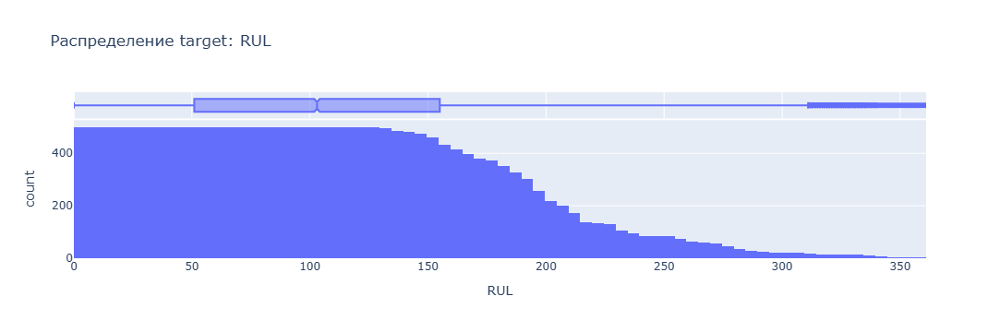

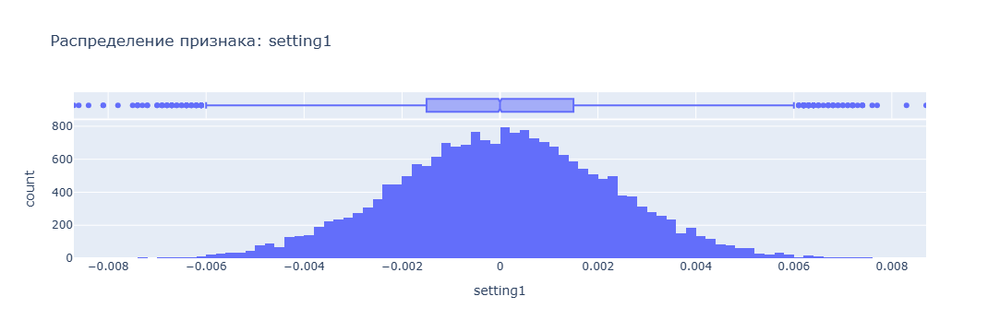

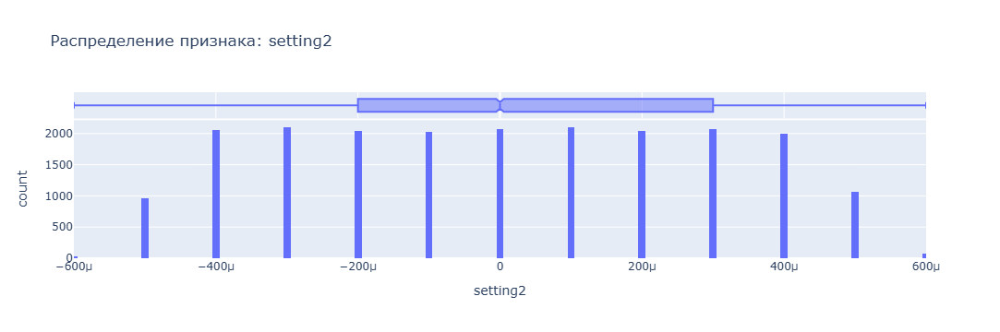

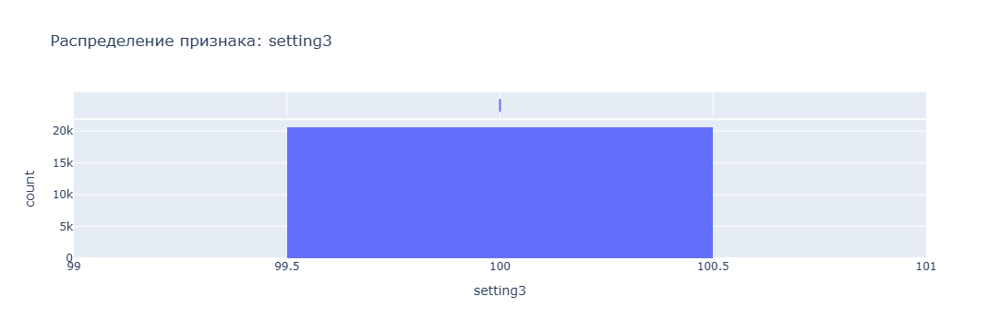

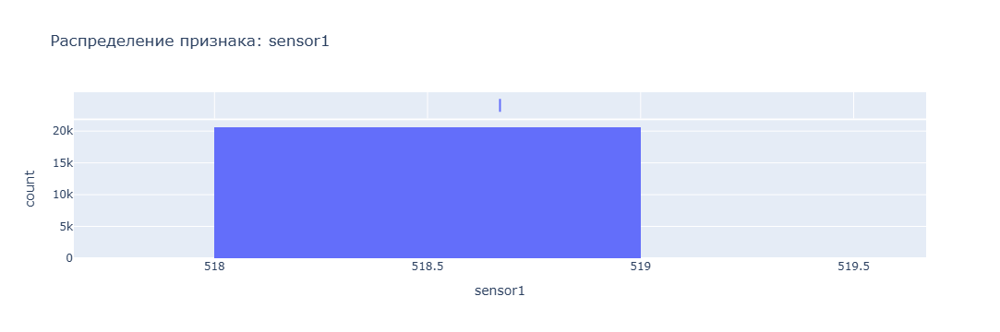

...

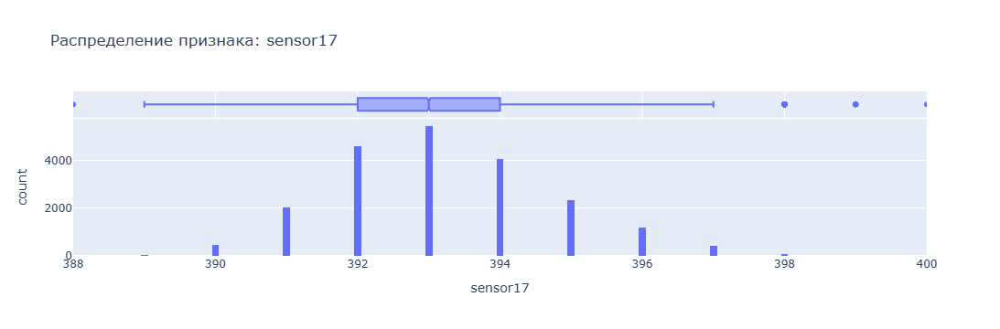

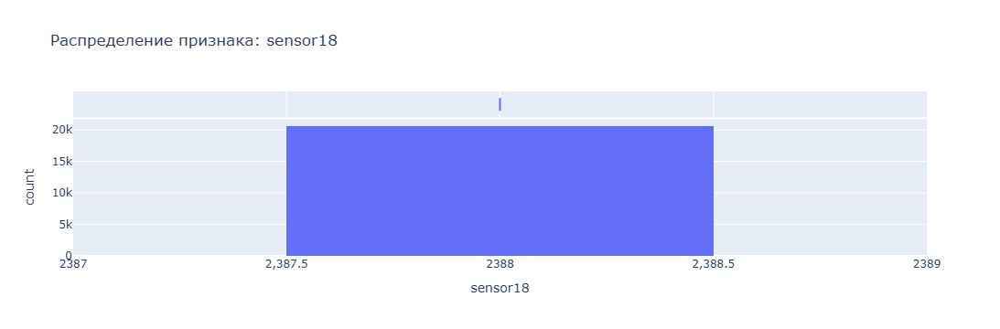

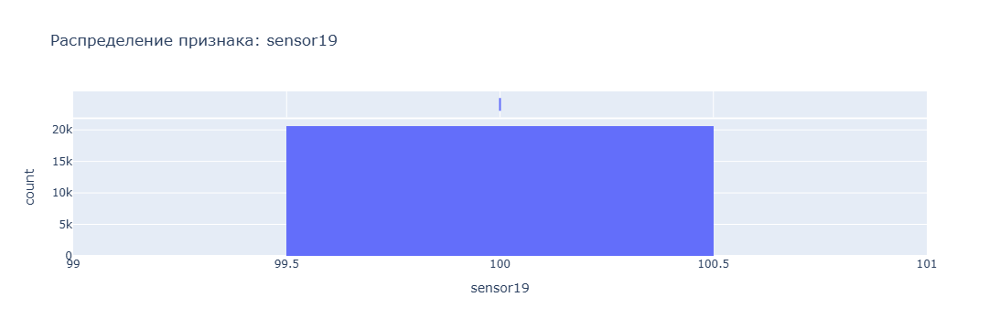

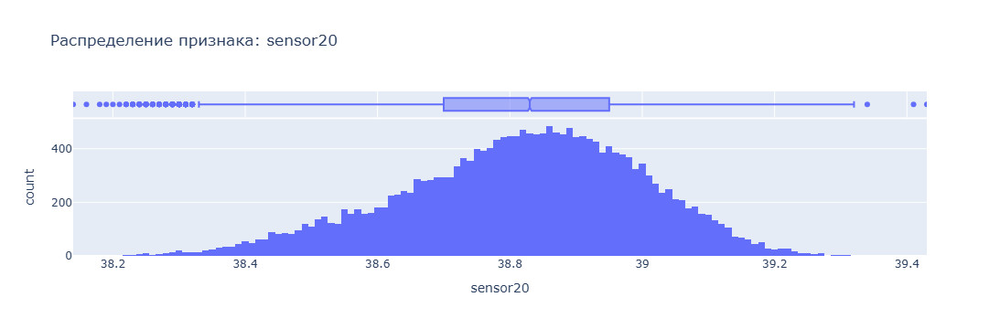

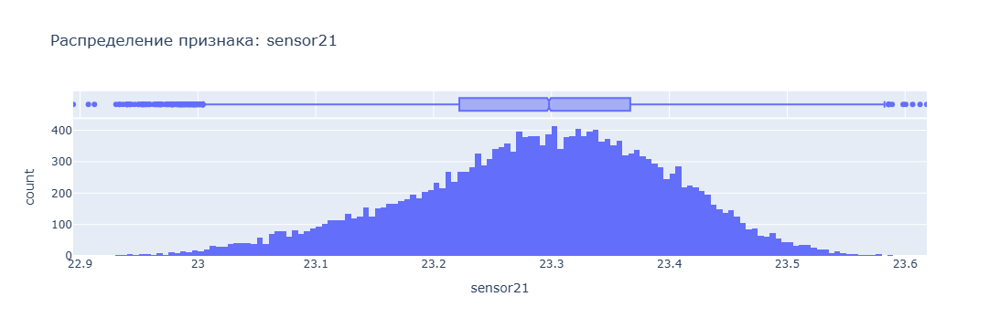

In [10]:
raw_feature_columns = [*SETTING_COLUMNS, *SENSOR_COLUMNS]
quality = pd.DataFrame({
    "dtype": train[raw_feature_columns].dtypes.astype(str),
    "missing": train[raw_feature_columns].isna().sum(),
    "nunique": train[raw_feature_columns].nunique(),
    "std": train[raw_feature_columns].std(),
}).sort_values(["nunique", "std"])
display(quality)

fig = px.histogram(train, x="RUL", nbins=100, marginal="box", histfunc="count",
                   range_x=[train["RUL"].min(), train["RUL"].max()],
                   title="Распределение target: RUL")
fig.show()

RUN_FULL_INTERACTIVE_EDA = True
if RUN_FULL_INTERACTIVE_EDA:
    for feature in raw_feature_columns:
        fig = px.histogram(
            train,
            x=feature,
            nbins=150,
            marginal="box",
            histfunc="count",
            range_x=[train[feature].min(), train[feature].max()],
            title=f"Распределение признака: {feature}",
        )
        fig.show()

## 5. Распределения и корреляции

Корреляции не используются для выбора признаков до cross-validation, чтобы не передавать информацию validation-двигателей в preprocessing. Здесь это только аналитическая диагностика: она помогает понять направления деградации и сформулировать разумные interaction features.

,corr_with_RUL
cycle,-0.736241
sensor11,-0.696228
sensor4,-0.678948
sensor12,0.671983
sensor7,0.657223
sensor15,-0.642667
sensor21,0.635662
sensor20,0.629428
sensor2,-0.606484
sensor17,-0.606154


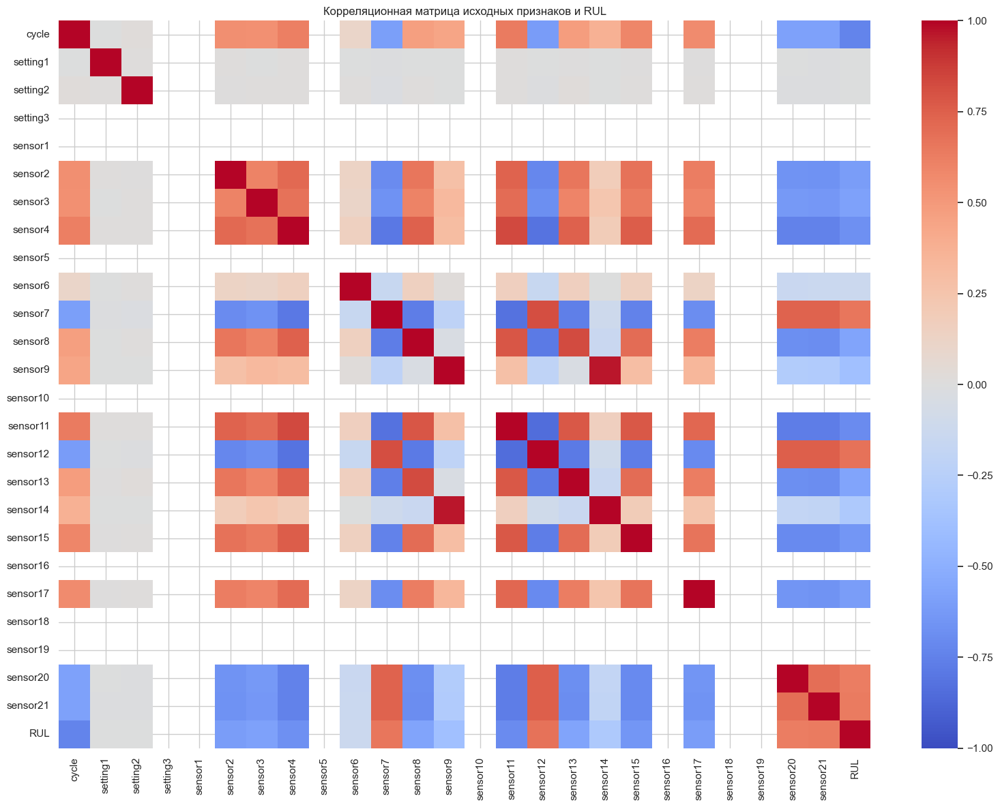

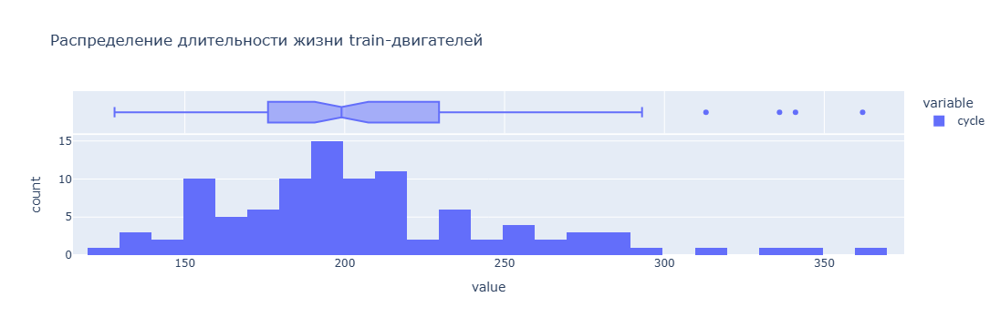

In [11]:
corr = train[["cycle", *raw_feature_columns, "RUL"]].corr(numeric_only=True)
rul_correlations = corr["RUL"].drop("RUL").sort_values(key=np.abs, ascending=False)
display(rul_correlations.to_frame("corr_with_RUL"))

plt.figure(figsize=(16, 12))
sns.heatmap(corr, cmap="coolwarm", center=0, vmin=-1, vmax=1)
plt.title("Корреляционная матрица исходных признаков и RUL")
plt.tight_layout()
plt.show()

engine_lifetimes = train.groupby("unit")["cycle"].max()
fig = px.histogram(engine_lifetimes, nbins=30, marginal="box",
                   title="Распределение длительности жизни train-двигателей")
fig.show()

## 6. Гибкая обработка выбросов

Для sensor/setting значений поддерживаются два правила границ: `IQR` и `quantile`, а также ручные overrides в `CONFIG.manual_bounds`. Временные ряды лучше **обрезать (`clip`)**, чем удалять: удаление отдельного цикла меняет контекст rolling/trend признаков. Transformer обучает границы только на train-fold и применяет их к validation/test.

In [12]:
class ConfigurableWinsorizer(BaseEstimator, TransformerMixin):
    def __init__(self, columns=None, method="iqr", iqr_factor=2.5,
                 lower_quantile=0.01, upper_quantile=0.99, manual_bounds=None):
        self.columns = columns
        self.method = method
        self.iqr_factor = iqr_factor
        self.lower_quantile = lower_quantile
        self.upper_quantile = upper_quantile
        self.manual_bounds = manual_bounds

    def fit(self, X, y=None):
        frame = pd.DataFrame(X).copy()
        columns = self.columns or frame.select_dtypes(include=np.number).columns.tolist()
        overrides = self.manual_bounds or {}
        self.bounds_ = {}
        for column in columns:
            if column not in frame:
                continue
            series = frame[column].dropna()
            if self.method == "iqr":
                q1, q3 = series.quantile([0.25, 0.75])
                spread = q3 - q1
                lower, upper = q1 - self.iqr_factor * spread, q3 + self.iqr_factor * spread
            elif self.method == "quantile":
                lower, upper = series.quantile([self.lower_quantile, self.upper_quantile])
            else:
                raise ValueError("method должен быть 'iqr' или 'quantile'")
            manual_lower, manual_upper = overrides.get(column, (None, None))
            self.bounds_[column] = (
                lower if manual_lower is None else manual_lower,
                upper if manual_upper is None else manual_upper,
            )
        return self

    def transform(self, X):
        frame = pd.DataFrame(X).copy()
        for column, (lower, upper) in self.bounds_.items():
            frame[column] = frame[column].clip(lower=lower, upper=upper)
        return frame

def filter_outliers_for_diagnostic(df, bounds):
    """Опциональный исследовательский фильтр; не используется по умолчанию для временной модели."""
    mask = pd.Series(True, index=df.index)
    for column, (lower, upper) in bounds.items():
        mask &= df[column].between(lower, upper) | df[column].isna()
    return df.loc[mask].copy()

diagnostic_winsorizer = ConfigurableWinsorizer(
    columns=raw_feature_columns,
    method=CONFIG.outlier_method,
    iqr_factor=CONFIG.iqr_factor,
    lower_quantile=CONFIG.lower_quantile,
    upper_quantile=CONFIG.upper_quantile,
    manual_bounds=CONFIG.manual_bounds,
).fit(train[raw_feature_columns])

bounds_df = pd.DataFrame(diagnostic_winsorizer.bounds_, index=["lower", "upper"]).T
bounds_df["below"] = [(train[c] < bounds_df.loc[c, "lower"]).sum() for c in bounds_df.index]
bounds_df["above"] = [(train[c] > bounds_df.loc[c, "upper"]).sum() for c in bounds_df.index]
bounds_df["affected_pct"] = (bounds_df["below"] + bounds_df["above"]) / len(train) * 100
display(bounds_df.sort_values("affected_pct", ascending=False))

if CONFIG.diagnostic_outlier_action == "filter":
    exploratory_clean_train = filter_outliers_for_diagnostic(train, diagnostic_winsorizer.bounds_)
elif CONFIG.diagnostic_outlier_action == "clip":
    exploratory_clean_train = diagnostic_winsorizer.transform(train)
else:
    raise ValueError("diagnostic_outlier_action должен быть 'clip' или 'filter'")
print("EDA outlier action:", CONFIG.diagnostic_outlier_action)
print("Строк до/после diagnostic обработки:", len(train), len(exploratory_clean_train))
# Например, задайте CONFIG.manual_bounds = {"sensor4": (None, 1450.0)} перед повторным запуском ячейки.

,lower,upper,below,above,affected_pct
sensor9,9012.30000,9110.22000,0,1026,4.973099
sensor14,8095.58250,8185.97250,0,871,4.221802
sensor6,21.61000,21.61000,406,0,1.967912
sensor8,2387.82500,2388.36500,0,7,0.033930
sensor13,2387.79000,2388.39000,0,7,0.033930
sensor3,1565.96000,1614.68000,0,3,0.014541
sensor17,387.00000,399.00000,0,1,0.004847
setting1,-0.00900,0.00900,0,0,0.000000
sensor12,518.48500,524.42500,0,0,0.000000
sensor20,38.07500,39.57500,0,0,0.000000


EDA outlier action: clip
Строк до/после diagnostic обработки: 20631 20631


## 7. Feature Engineering

Новые признаки отражают природу predictive maintenance:
- `cycle` и его преобразования описывают возраст двигателя;
- изменения относительно первого цикла и предыдущего цикла фиксируют деградацию;
- rolling mean/std/slope сглаживают шум и показывают устойчивый тренд;
- interaction features приближённо описывают температурные, pressure, spool-speed и cooling-отношения;
- `operating_condition` подготовлен как категориальный режим работы и кодируется внутри pipeline.

In [13]:
def add_engineered_features(df, config=CONFIG):
    result = df.sort_values(["unit", "cycle"]).copy()
    result["cycle_sq"] = result["cycle"] ** 2
    result["cycle_sqrt"] = np.sqrt(result["cycle"])
    result["operating_condition"] = result[SETTING_COLUMNS].round(3).astype(str).agg("|".join, axis=1)

    for sensor in SENSOR_COLUMNS:
        group = result.groupby("unit")[sensor]
        result[f"{sensor}_delta_1"] = group.diff().fillna(0.0)
        result[f"{sensor}_from_start"] = result[sensor] - group.transform("first")

    for sensor in config.trend_sensors:
        grouped = result.groupby("unit")[sensor]
        for window in config.rolling_windows:
            rolling = grouped.rolling(window, min_periods=1)
            result[f"{sensor}_mean_{window}"] = rolling.mean().reset_index(level=0, drop=True)
            result[f"{sensor}_std_{window}"] = rolling.std().reset_index(level=0, drop=True).fillna(0.0)
            result[f"{sensor}_trend_{window}"] = (
                result[sensor] - grouped.shift(window - 1).fillna(result[sensor])
            ) / max(window - 1, 1)

    result["temperature_spread"] = result["sensor4"] - result["sensor2"]
    result["pressure_proxy_ratio"] = result["sensor11"] / result["sensor7"].replace(0, np.nan)
    result["cooling_bleed_total"] = result["sensor20"] + result["sensor21"]
    result["spool_speed_ratio"] = result["sensor9"] / result["sensor8"].replace(0, np.nan)
    result["temperature_x_pressure"] = result["sensor4"] * result["sensor11"]
    return result.replace([np.inf, -np.inf], np.nan)

train_features = add_engineered_features(train)
test_features = add_engineered_features(test_raw)

excluded = {"unit", "RUL", "operating_condition"}
numeric_features = [c for c in train_features.columns if c not in excluded and pd.api.types.is_numeric_dtype(train_features[c])]
outlier_features = [c for c in numeric_features if not c.startswith("cycle")]
categorical_features = ["operating_condition"]
model_features = [*numeric_features, *categorical_features]

print(f"Признаков до engineering: {len(raw_feature_columns) + 1}")
print(f"Признаков после engineering: {len(model_features)}")
print(f"Признаков с clipping (исключая возраст двигателя): {len(outlier_features)}")
display(train_features[model_features + ["RUL"]].head())

Признаков до engineering: 25
Признаков после engineering: 156
Признаков с clipping (исключая возраст двигателя): 152


,cycle,setting1,setting2,setting3,sensor1,sensor2,sensor3,sensor4,sensor5,sensor6,sensor7,sensor8,sensor9,sensor10,sensor11,sensor12,sensor13,sensor14,sensor15,sensor16,sensor17,sensor18,sensor19,sensor20,sensor21,cycle_sq,cycle_sqrt,sensor1_delta_1,sensor1_from_start,sensor2_delta_1,sensor2_from_start,sensor3_delta_1,sensor3_from_start,sensor4_delta_1,sensor4_from_start,sensor5_delta_1,sensor5_from_start,sensor6_delta_1,sensor6_from_start,sensor7_delta_1,sensor7_from_start,sensor8_delta_1,sensor8_from_start,sensor9_delta_1,sensor9_from_start,sensor10_delta_1,sensor10_from_start,sensor11_delta_1,sensor11_from_start,sensor12_delta_1,sensor12_from_start,sensor13_delta_1,sensor13_from_start,sensor14_delta_1,sensor14_from_start,sensor15_delta_1,sensor15_from_start,sensor16_delta_1,sensor16_from_start,sensor17_delta_1,...,sensor7_std_5,sensor7_trend_5,sensor7_mean_10,sensor7_std_10,sensor7_trend_10,sensor7_mean_20,sensor7_std_20,sensor7_trend_20,sensor11_mean_5,sensor11_std_5,sensor11_trend_5,sensor11_mean_10,sensor11_std_10,sensor11_trend_10,sensor11_mean_20,sensor11_std_20,sensor11_trend_20,sensor12_mean_5,sensor12_std_5,sensor12_trend_5,sensor12_mean_10,sensor12_std_10,sensor12_trend_10,sensor12_mean_20,sensor12_std_20,sensor12_trend_20,sensor15_mean_5,sensor15_std_5,sensor15_trend_5,sensor15_mean_10,sensor15_std_10,sensor15_trend_10,sensor15_mean_20,sensor15_std_20,sensor15_trend_20,sensor20_mean_5,sensor20_std_5,sensor20_trend_5,sensor20_mean_10,sensor20_std_10,sensor20_trend_10,sensor20_mean_20,sensor20_std_20,sensor20_trend_20,sensor21_mean_5,sensor21_std_5,sensor21_trend_5,sensor21_mean_10,sensor21_std_10,sensor21_trend_10,sensor21_mean_20,sensor21_std_20,sensor21_trend_20,temperature_spread,pressure_proxy_ratio,cooling_bleed_total,spool_speed_ratio,temperature_x_pressure,operating_condition,RUL
0,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,1,1.000000,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0000,0.0000,0.0,0.0,0.0,...,0.000000,0.00,554.360000,0.000000,0.0,554.360000,0.000000,0.0,47.470,0.000000,0.0000,47.470,0.000000,0.0,47.470,0.000000,0.0,521.660,0.000000,0.0000,521.660,0.000000,0.0,521.660,0.000000,0.0,8.419500,0.000000,0.000000,8.419500,0.000000,0.0,8.419500,0.000000,0.0,39.060000,0.000000,0.00,39.060000,0.000000,0.0,39.060000,0.000000,0.0,23.419000,0.000000,0.00000,23.419000,0.000000,0.0,23.419000,0.000000,0.0,758.78,0.085630,62.4790,3.788092,66486.4820,-0.001|-0.0|100.0,191
1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,4,1.414214,0.0,0.0,0.33,0.33,2.12,2.12,2.54,2.54,0.0,0.0,0.0,0.0,-0.61,-0.61,-0.02,-0.02,-2.12,-2.12,0.0,0.0,0.02,0.02,0.62,0.62,0.05,0.05,-7.13,-7.13,0.0123,0.0123,0.0,0.0,0.0,...,0.431335,0.00,554.055000,0.431335,0.0,554.055000,0.431335,0.0,47.480,0.014142,0.0000,47.480,0.014142,0.0,47.480,0.014142,0.0,521.970,0.438406,0.0000,521.970,0.438406,0.0,521.970,0.438406,0.0,8.425650,0.008697,0.000000,8.425650,0.008697,0.0,8.425650,0.008697,0.0,39.030000,0.042426,0.00,39.030000,0.042426,0.0,39.030000,0.042426,0.0,23.421300,0.003253,0.00000,23.421300,0.003253,0.0,23.421300,0.003253,0.0,760.99,0.085761,62.4236,3.787236,66635.1186,0.002|-0.0|100.0,190
2,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,9,1.732051,0.0,0.0,0.20,0.53,-3.83,-1.71,1.06,3.60,0.0,0.0,0.0,0.0,0.51,-0.10,0.04,0.02,8.87,6.75,0.0,0.0,-0.22,-0.20,0.14,0.76,-0.04,0.01,1.74,-5.39,-0.0140,-0.0017,0.0,0.0,-2.0,...,0.327159,0.00,554.123333,0.327159,0.0,554.123333,0.327159,0.0,47.410,0.121655,0.0000,47.410,0.121655,0.0,47.410,0.121655,0.0,522.120,0.404475,0.0000,522.120,0.404475,0.0,522.120,0.404475,0.0,8.423033

## 8. Unified Preprocessing Pipeline

В pipeline объединяются clipping, заполнение пропусков, scaling числовых признаков и one-hot encoding operating mode. Для деревьев scaling не обязателен, но единый интерфейс делает сравнение моделей прозрачным; для линейного baseline scaling существенен.

In [14]:
def build_preprocessor(numerical, categorical):
    numeric_pipe = Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
    ])
    categorical_pipe = Pipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore")),
    ])
    return ColumnTransformer([
        ("numeric", numeric_pipe, numerical),
        ("categorical", categorical_pipe, categorical),
    ])

def build_pipeline(model):
    return Pipeline([
        ("outliers", ConfigurableWinsorizer(
            columns=outlier_features,
            method=CONFIG.outlier_method,
            iqr_factor=CONFIG.iqr_factor,
            lower_quantile=CONFIG.lower_quantile,
            upper_quantile=CONFIG.upper_quantile,
            manual_bounds=CONFIG.manual_bounds,
        )),
        ("preprocess", build_preprocessor(numeric_features, categorical_features)),
        ("model", model),
    ])

X = train_features[model_features]
y = train_features["RUL"]
groups = train_features["unit"]
cv = GroupKFold(n_splits=CONFIG.cv_folds)
print("Group-aware CV готова. Число двигателей:", groups.nunique())

Group-aware CV готова. Число двигателей: 100


## 9. Набор моделей и Cross-Validation

`CatBoost`, `LightGBM` и `XGBoost` добавляются автоматически, когда соответствующие пакеты установлены. `RandomForest` и `ExtraTrees` дают устойчивые tree-baselines, а `Ridge` показывает, насколько далеко мы ушли от простой линейной модели.

In [15]:
# !pip install catboost

In [16]:
# !pip install lightgbm

In [17]:
# !pip install xgboost

,model,cv_mae_mean,cv_mae_std,cv_rmse_mean,cv_r2_mean,fit_time_sec
0,ExtraTrees,23.468,1.939,34.903,0.742,35.389
1,LightGBM,23.617,2.591,35.534,0.731,9.458
2,XGBoost,23.755,2.617,35.634,0.730,12.017
3,RandomForest,23.985,2.270,35.669,0.730,162.435
4,CatBoost,24.245,2.183,36.009,0.725,22.381
5,Ridge baseline,29.262,3.038,39.874,0.662,1.437


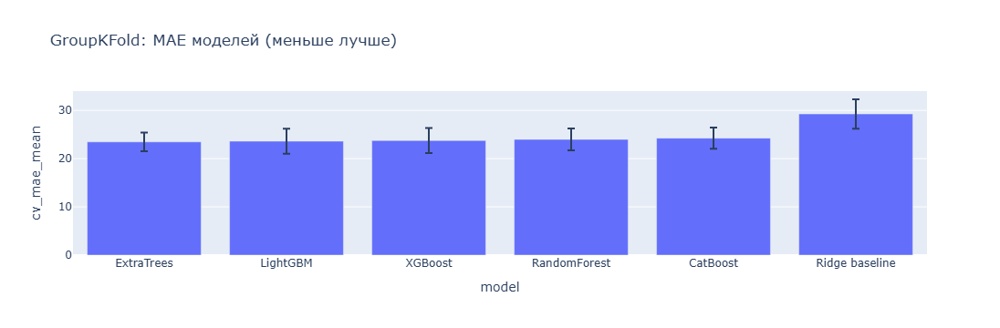

In [18]:
models = {
    "Ridge baseline": Ridge(alpha=10.0),
    "RandomForest": RandomForestRegressor(
        n_estimators=250, min_samples_leaf=4, n_jobs=-1, random_state=CONFIG.random_state
    ),
    "ExtraTrees": ExtraTreesRegressor(
        n_estimators=250, min_samples_leaf=3, n_jobs=-1, random_state=CONFIG.random_state
    ),
}

if importlib.util.find_spec("catboost"):
    from catboost import CatBoostRegressor
    models["CatBoost"] = CatBoostRegressor(
        iterations=400, depth=7, learning_rate=0.05, loss_function="RMSE",
        verbose=False, random_seed=CONFIG.random_state, allow_writing_files=False
    )
else:
    print("CatBoost пропущен: пакет не установлен")

if importlib.util.find_spec("lightgbm"):
    from lightgbm import LGBMRegressor
    models["LightGBM"] = LGBMRegressor(
        n_estimators=400, learning_rate=0.05, num_leaves=31,
        random_state=CONFIG.random_state, verbosity=-1
    )
else:
    print("LightGBM пропущен: пакет не установлен")

if importlib.util.find_spec("xgboost"):
    from xgboost import XGBRegressor
    models["XGBoost"] = XGBRegressor(
        n_estimators=400, max_depth=6, learning_rate=0.05, subsample=0.85,
        colsample_bytree=0.85, objective="reg:squarederror", n_jobs=-1,
        random_state=CONFIG.random_state
    )
else:
    print("XGBoost пропущен: пакет не установлен")

scoring = {"mae": "neg_mean_absolute_error", "rmse": "neg_root_mean_squared_error", "r2": "r2"}
cv_rows = []
for name, model in models.items():
    scores = cross_validate(build_pipeline(model), X, y, groups=groups, cv=cv, scoring=scoring, n_jobs=1)
    cv_rows.append({
        "model": name,
        "cv_mae_mean": -scores["test_mae"].mean(),
        "cv_mae_std": scores["test_mae"].std(),
        "cv_rmse_mean": -scores["test_rmse"].mean(),
        "cv_r2_mean": scores["test_r2"].mean(),
        "fit_time_sec": scores["fit_time"].mean(),
    })

cv_results = pd.DataFrame(cv_rows).sort_values("cv_mae_mean").reset_index(drop=True)
display(cv_results.style.format({c: "{:.3f}" for c in cv_results.columns if c != "model"}))
fig = px.bar(cv_results, x="model", y="cv_mae_mean", error_y="cv_mae_std",
             title="GroupKFold: MAE моделей (меньше лучше)")
fig.show()

## 10. Настройка лучшего семейства моделей

После первичного сравнения выбираем лидирующий алгоритм и выполняем ограниченный `RandomizedSearchCV`. Поиск также использует `GroupKFold`, поэтому один двигатель не может оказаться одновременно в обучающей и проверочной части.

In [19]:
parameter_spaces = {
    "Ridge baseline": {"model__alpha": np.logspace(-2, 3, 30)},
    "RandomForest": {
        "model__n_estimators": [200, 350, 500], "model__max_depth": [None, 8, 14, 20],
        "model__min_samples_leaf": [1, 2, 4, 8], "model__max_features": ["sqrt", 0.7, 1.0],
    },
    "ExtraTrees": {
        "model__n_estimators": [200, 350, 500], "model__max_depth": [None, 8, 14, 20],
        "model__min_samples_leaf": [1, 2, 4, 8], "model__max_features": ["sqrt", 0.7, 1.0],
    },
    "CatBoost": {
        "model__iterations": [250, 400, 650], "model__depth": [5, 7, 9],
        "model__learning_rate": [0.02, 0.05, 0.1], "model__l2_leaf_reg": [1, 3, 7],
    },
    "LightGBM": {
        "model__n_estimators": [250, 400, 650], "model__num_leaves": [15, 31, 63],
        "model__learning_rate": [0.02, 0.05, 0.1], "model__min_child_samples": [10, 20, 40],
    },
    "XGBoost": {
        "model__n_estimators": [250, 400, 650], "model__max_depth": [3, 5, 7],
        "model__learning_rate": [0.02, 0.05, 0.1], "model__subsample": [0.7, 0.85, 1.0],
    },
}

winner_name = cv_results.loc[0, "model"]
search = RandomizedSearchCV(
    estimator=build_pipeline(models[winner_name]),
    param_distributions=parameter_spaces[winner_name],
    n_iter=CONFIG.tuning_iterations,
    scoring="neg_mean_absolute_error",
    cv=cv,
    random_state=CONFIG.random_state,
    n_jobs=1,
    verbose=1,
    refit=True,
)
search.fit(X, y, groups=groups)
print("Лучшее семейство:", winner_name)
print("CV MAE после tuning:", -search.best_score_)
print("Лучшие параметры:", search.best_params_)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Лучшее семейство: ExtraTrees
CV MAE после tuning: 23.482825022392767
Лучшие параметры: {'model__n_estimators': 200, 'model__min_samples_leaf': 4, 'model__max_features': 0.7, 'model__max_depth': None}


## 11. Финальная оценка на официальном CMAPSS test

Официальный test содержит неполные траектории. Поэтому строим признаки по всей наблюдаемой истории каждого test-двигателя, берём его последнюю наблюдаемую строку и сравниваем предсказанный остаточный ресурс с `RUL_FD001.txt`.

Official FD001 test metrics: {'mae': 15.446188095238096, 'rmse': 22.90846153763838, 'r2': 0.6960988774013641}


,unit,actual_rul,predicted_rul,absolute_error
0,1,112,194.932048,82.932048
77,78,107,186.312286,79.312286
14,15,83,162.258119,79.258119
49,50,79,126.539679,47.539679
13,14,107,154.517143,47.517143
44,45,114,71.398107,42.601893
1,2,98,138.764155,40.764155
66,67,77,116.242333,39.242333
21,22,111,149.596071,38.596071
98,99,117,154.096167,37.096167


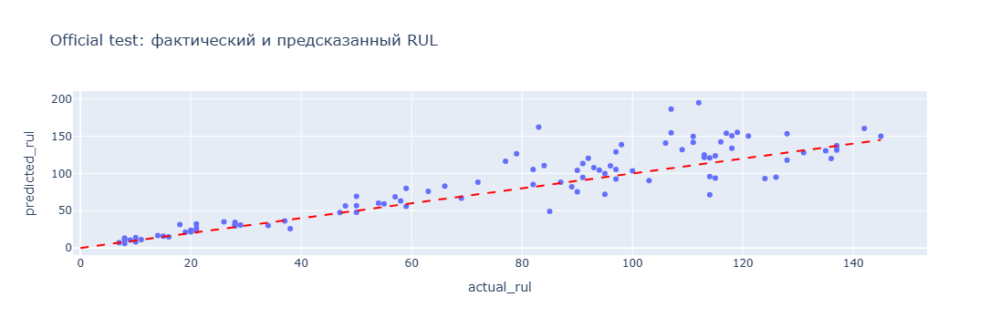

In [20]:
official_last = (
    test_features.sort_values(["unit", "cycle"])
    .groupby("unit", as_index=False)
    .tail(1)
    .sort_values("unit")
)
X_official = official_last[model_features]
y_official = official_rul["RUL"].to_numpy()
best_model = search.best_estimator_
official_pred = best_model.predict(X_official)

official_metrics = {
    "mae": float(mean_absolute_error(y_official, official_pred)),
    "rmse": float(np.sqrt(mean_squared_error(y_official, official_pred))),
    "r2": float(r2_score(y_official, official_pred)),
}
print("Official FD001 test metrics:", official_metrics)

prediction_frame = pd.DataFrame({
    "unit": official_last["unit"].to_numpy(), "actual_rul": y_official,
    "predicted_rul": official_pred, "absolute_error": np.abs(y_official - official_pred),
})
display(prediction_frame.sort_values("absolute_error", ascending=False).head(10))

fig = px.scatter(prediction_frame, x="actual_rul", y="predicted_rul", hover_data=["unit"],
                 title="Official test: фактический и предсказанный RUL")
fig.add_shape(type="line", x0=0, y0=0, x1=prediction_frame.actual_rul.max(),
              y1=prediction_frame.actual_rul.max(), line=dict(dash="dash", color="red"))
fig.show()

## 12. Feature Importance и анализ ошибок

Permutation importance оценивает влияние исходных и engineered-признаков на официальный holdout независимо от того, имеет ли выбранная модель встроенный атрибут `feature_importances_`.

,feature,importance_mean,importance_std
48,sensor11_from_start,1.360153,0.584679
44,sensor9_from_start,0.786863,0.310629
54,sensor14_from_start,0.687726,0.245061
153,spool_speed_ratio,0.663832,0.210377
17,sensor14,0.622045,0.201601
12,sensor9,0.601084,0.150959
34,sensor4_from_start,0.565666,0.194131
42,sensor8_from_start,0.447518,0.197454
50,sensor12_from_start,0.382922,0.154036
40,sensor7_from_start,0.336866,0.146361


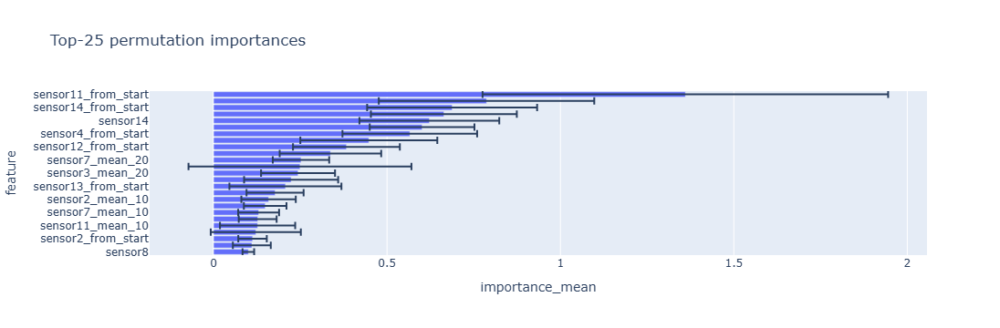

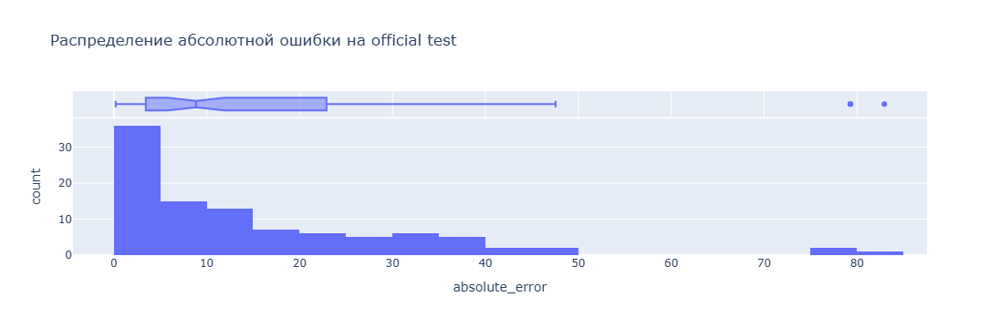

In [21]:
importance = permutation_importance(
    best_model, X_official, y_official, scoring="neg_mean_absolute_error",
    n_repeats=10, random_state=CONFIG.random_state, n_jobs=1,
)
importance_df = pd.DataFrame({
    "feature": model_features,
    "importance_mean": importance.importances_mean,
    "importance_std": importance.importances_std,
}).sort_values("importance_mean", ascending=False)
display(importance_df.head(25))

fig = px.bar(importance_df.head(25).sort_values("importance_mean"), x="importance_mean", y="feature",
             orientation="h", error_x="importance_std", title="Top-25 permutation importances")
fig.show()

fig = px.histogram(prediction_frame, x="absolute_error", nbins=30, marginal="box",
                   title="Распределение абсолютной ошибки на official test")
fig.show()

## 13. Сохранение результатов

Сохраняем полный sklearn pipeline, таблицу cross-validation, официальный прогноз, importance и JSON с конфигурацией/метриками. Благодаря этому последующие эксперименты можно сравнивать без ручного переноса результатов.

In [ ]:
model_path = ARTIFACT_DIR / "best_rul_pipeline.joblib"
results_path = ARTIFACT_DIR / "cv_results.csv"
predictions_path = ARTIFACT_DIR / "official_test_predictions.csv"
importance_path = ARTIFACT_DIR / "feature_importance.csv"
summary_path = ARTIFACT_DIR / "experiment_summary.json"

joblib.dump(best_model, model_path)
cv_results.to_csv(results_path, index=False)
prediction_frame.to_csv(predictions_path, index=False)
importance_df.to_csv(importance_path, index=False)
summary = {
    "dataset": f"NASA CMAPSS {CONFIG.subset}",
    "target_logic": "RUL = max_cycle_per_train_unit - current_cycle",
    "winner": winner_name,
    "best_cv_mae": float(-search.best_score_),
    "best_params": search.best_params_,
    "official_test_metrics": official_metrics,
    "n_features": len(model_features),
    "config": asdict(CONFIG),
}
with open(summary_path, "w", encoding="utf-8") as file:
    json.dump(summary, file, ensure_ascii=False, indent=2)

display(pd.Series(summary, name="value"))
print("Артефакты сохранены в:", ARTIFACT_DIR)

## Выводы и следующие эксперименты

Этот notebook устраняет основные методологические слабости baseline: preprocessing обучается в folds, validation разделён по двигателям, а результат проверяется на официальном test. Дальше имеет смысл сравнить `clip` против разных quantile/IQR параметров, добавить capped-RUL target как отдельный эксперимент и расширить обучение на `FD002-FD004`, где режимы работы и fault modes сложнее.